<a href="https://colab.research.google.com/github/TFmohamedyahia/image_classification/blob/main/3_Six_Categories_Images_Classifications.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

first step you need upload (kaggle.json) file thare

In [13]:
!mkdir -p ~/.kaggle
!cp kaggle.json -p ~/.kaggle

In [14]:
# in this step we will download dataset from kaggle using kaggle API
!kaggle datasets download -d puneet6060/intel-image-classification

intel-image-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [15]:
# extract zipfile of dataset
import zipfile

zip = zipfile.ZipFile('/content/intel-image-classification.zip','r')
zip.extractall('/content')
zip.close()

In [40]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
from keras.layers import MaxPool2D, Dense, Flatten, Dropout, Conv2D
import keras

In [17]:
# Read files
trainpath = '/content/seg_train'
testpath = '/content/seg_test'
predpath = '/content/seg_pred'

In [18]:
# in this step to look at the content inside folder 1_train
total = 0
for folder in os.listdir(trainpath + '/seg_train'):
    file = gb.glob(pathname= str(trainpath + '/seg_train/' + folder +  '/*.jpg'))
    print(f"number of files train in folder {folder} => {len(file)}")
    total += len(file)

print(f"Total => {total}")

number of files train in folder street => 2382
number of files train in folder glacier => 2404
number of files train in folder forest => 2271
number of files train in folder mountain => 2512
number of files train in folder buildings => 2191
number of files train in folder sea => 2274
Total => 14034


In [19]:
# in this step to look at the content inside folder 2_test
total = 0
for folder in os.listdir(testpath + '/seg_test'):
    file = gb.glob(pathname= str(testpath + '/seg_test/' + folder +  '/*.jpg'))
    print(f"number of files test in folder {folder} => {len(file)}")
    total += len(file)

print(f"Total => {total}")

number of files test in folder street => 501
number of files test in folder glacier => 553
number of files test in folder forest => 474
number of files test in folder mountain => 525
number of files test in folder buildings => 437
number of files test in folder sea => 510
Total => 3000


In [20]:
# in this step to look at the content inside folder pred
file = gb.glob(pathname= str(predpath + '/seg_pred' + '/*.jpg'))
print(len(file))

7301


In [21]:
# now show the images sizes in train folder
size = []
for folder in os.listdir(trainpath + '/seg_train'):
    files = gb.glob(pathname= str(trainpath + '/seg_train/' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(136, 150, 3)        2
(108, 150, 3)        2
(134, 150, 3)        2
(123, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(144, 150, 3)        2
(142, 150, 3)        2
(147, 150, 3)        1
(103, 150, 3)        1
(81, 150, 3)         1
(100, 150, 3)        1
(141, 150, 3)        1
(145, 150, 3)        1
(124, 150, 3)        1
(131, 150, 3)        1
(102, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(76, 150, 3)         1
(149, 150, 3)        1
(119, 150, 3)        1
(97, 150, 3)         1
(105, 150, 3)        1
(110, 150, 3)        1
(120, 150, 3)        1
(140, 150, 3)        1
dtype: int64

In [22]:
# now show the images sizes in test folder
size = []
for folder in os.listdir(testpath + '/seg_test'):
    files = gb.glob(pathname= str(testpath + '/seg_test/' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(76, 150, 3)        1
(110, 150, 3)       1
(149, 150, 3)       1
(72, 150, 3)        1
(141, 150, 3)       1
(131, 150, 3)       1
(81, 150, 3)        1
dtype: int64

In [23]:
# now show the images sizes in pred folder
size = []

files = gb.glob(pathname= str(predpath  + '/seg_pred' + '/*.jpg'))
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(144, 150, 3)       1
(129, 150, 3)       1
(374, 500, 3)       1
(124, 150, 3)       1
(139, 150, 3)       1
(108, 150, 3)       1
(143, 150, 3)       1
(112, 150, 3)       1
(133, 150, 3)       1
(149, 150, 3)       1
(100, 150, 3)       1
(131, 150, 3)       1
(126, 150, 3)       1
dtype: int64

In [24]:
# creat dictionary for 6 categories
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

# also create a function to get the code back
def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

In [25]:
# s is new size for image
s = 100
# now to read all pictues in six categories in training folder, ans use OpenCV to resize it ,
# and not to forget to assign the y value , from the predefined function

x_train = []
y_train = []

for folder in os.listdir(trainpath + '/seg_train'):
    files = gb.glob(pathname= trainpath + '/seg_train/' + folder + '/*.jpg')
    for i in files:
        image = cv2.imread(i)
        new_image = cv2.resize(image, (s,s))
        x_train.append(list(new_image))
        y_train.append(code[folder])

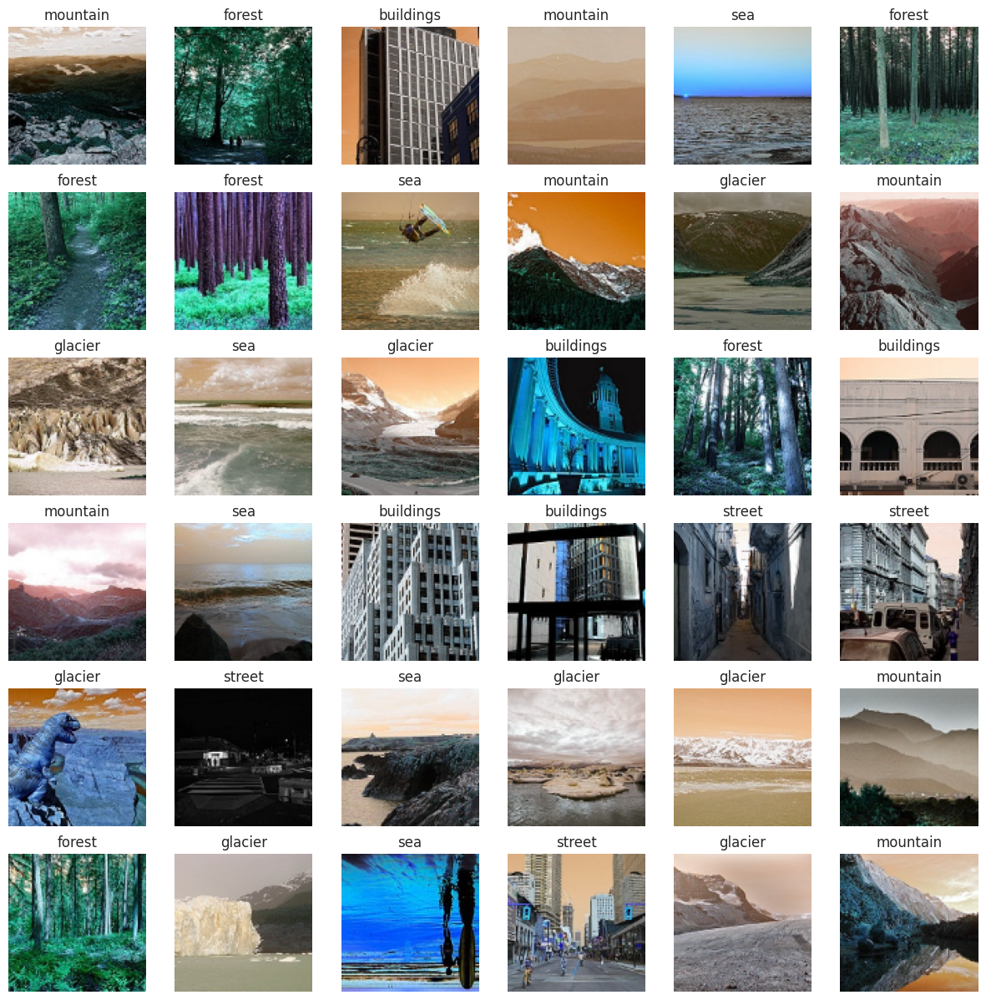

In [26]:
# also we have have a look to random pictures in X_train , and to adjust their title using the y value
plt.figure(figsize=(15,15))

for n, i in enumerate(list(np.random.randint(0,len(x_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [27]:

# now to read all pictues in six categories in test folder, ans use OpenCV to resize it ,
# and not to forget to assign the y value , from the predefined function
x_test = []
y_test = []

for folder in os.listdir(testpath + '/seg_test'):
    files = gb.glob(pathname= testpath + '/seg_test/' + folder + '/*.jpg')
    for file in files:
        image = cv2.imread(file)
        new_image = cv2.resize(image, (s,s))
        x_test.append(list(new_image))
        y_test.append(code[folder])

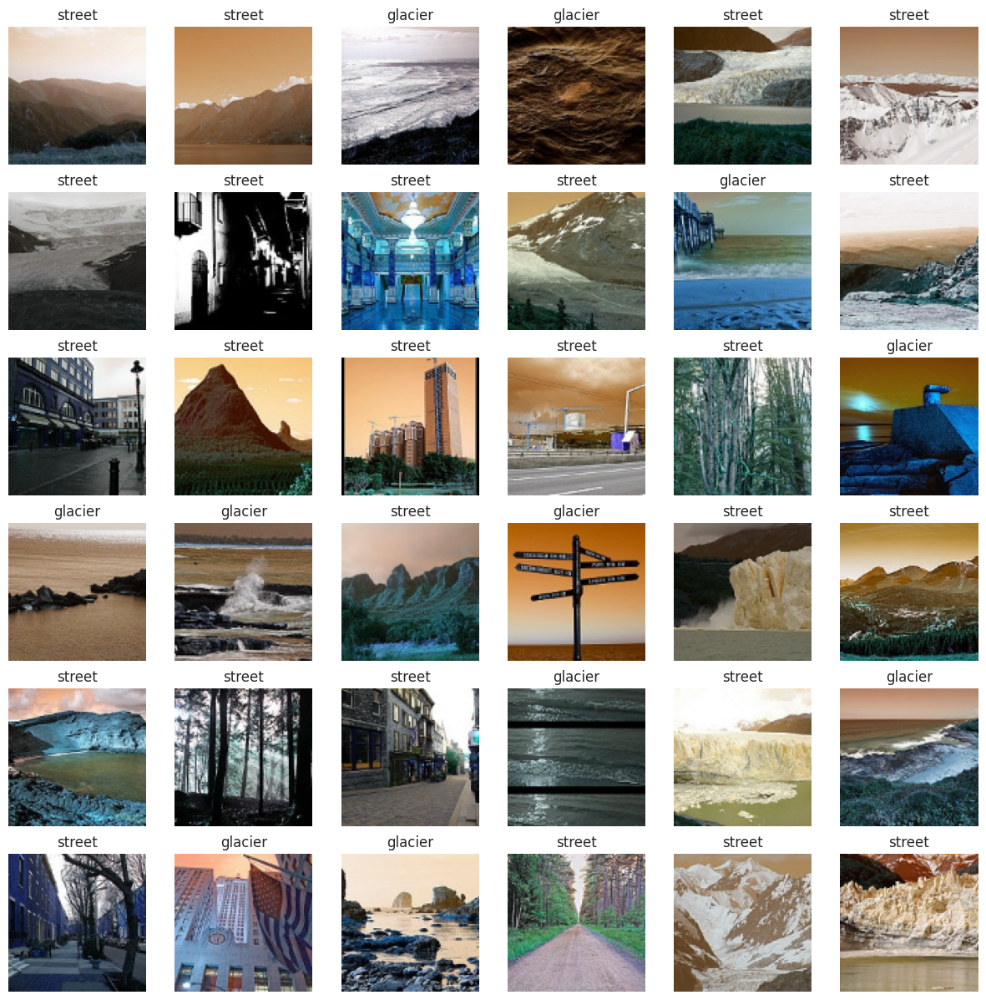

In [28]:
# also we have have a look to random pictures in y_test , and to adjust their title using the y value
plt.figure(figsize=(15,15))

for n, i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [29]:
# also with Prediction data , without having title ofcourse
x_pred = []
files = gb.glob(pathname= predpath + '/seg_pred/*.jpg')
for file in files:
    image = cv2.imread(file)
    new_image = cv2.resize(image , (s,s))
    x_pred.append(list(new_image))

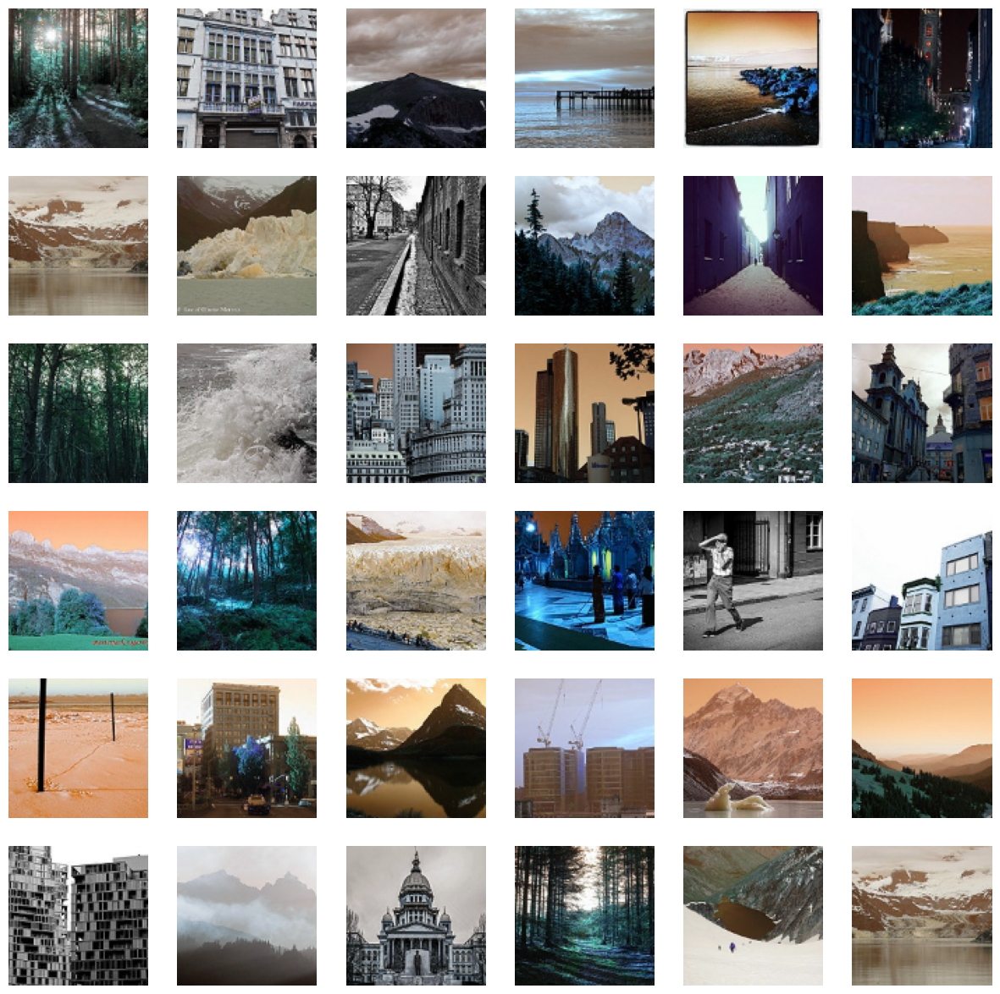

In [30]:

plt.figure(figsize=(15,15))
for n, i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')


In [31]:
x_train = np.array(x_train)
x_test = np.array(x_test)
x_pred = np.array(x_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print('x_train ',x_train.shape)
print('x_test ',x_test.shape)
print('x_pred ',x_pred.shape)
print('y_train ',y_train.shape)
print('y_test ',y_test.shape)

x_train  (14034, 100, 100, 3)
x_test  (3000, 100, 100, 3)
x_pred  (7301, 100, 100, 3)
y_train  (14034,)
y_test  (3000,)


In [35]:
# now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses
KerasModel = keras.models.Sequential([
        Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        Conv2D(150,kernel_size=(3,3),activation='relu'),
        MaxPool2D(4,4),
        Conv2D(120,kernel_size=(3,3),activation='relu'),
        Conv2D(80,kernel_size=(3,3),activation='relu'),
        Conv2D(50,kernel_size=(3,3),activation='relu'),
        MaxPool2D(4,4),
        Flatten() ,
        Dense(120,activation='relu') ,
        Dense(100,activation='relu') ,
        Dense(50,activation='relu') ,
        Dropout(rate=0.5) ,
        Dense(6,activation='softmax') ,
        ])

In [36]:
# now to compile the model
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [37]:
# show details model
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 98, 98, 200)       5600      
                                                                 
 conv2d_6 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 24, 24, 150)      0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_8 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_9 (Conv2D)           (None, 18, 18, 50)        36050     
                                 

In [44]:
# now to train the model
epochs = 10
ThisModel = KerasModel.fit(x_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/10
220/220 [==============================] - 41s 188ms/step - loss: 1.1824 - accuracy: 0.5092
Epoch 2/10
220/220 [==============================] - 40s 181ms/step - loss: 1.0325 - accuracy: 0.5842
Epoch 3/10
220/220 [==============================] - 40s 183ms/step - loss: 0.9555 - accuracy: 0.6236
Epoch 4/10
220/220 [==============================] - 40s 183ms/step - loss: 0.8653 - accuracy: 0.6815
Epoch 5/10
220/220 [==============================] - 40s 183ms/step - loss: 0.8120 - accuracy: 0.7073
Epoch 6/10
220/220 [==============================] - 40s 184ms/step - loss: 0.7108 - accuracy: 0.7555
Epoch 7/10
220/220 [==============================] - 41s 184ms/step - loss: 0.6581 - accuracy: 0.7732
Epoch 8/10
220/220 [==============================] - 41s 185ms/step - loss: 0.6282 - accuracy: 0.7884
Epoch 9/10
220/220 [==============================] - 41s 185ms/step - loss: 0.5582 - accuracy: 0.8159
Epoch 10/10
220/220 [==============================] - 41s 185ms/step - l

In [47]:
# how is the final loss & accuracy
ModelLoss, ModelAccuracy = KerasModel.evaluate(x_test, y_test)

print(f'Test Loss is {ModelLoss}')
print(f'Test Accuracy is {ModelAccuracy}')

94/94 [==============================] - 3s 30ms/step - loss: 0.6151 - accuracy: 0.7957
Test Loss is 0.6151454448699951
Test Accuracy is 0.7956666946411133


In [53]:
# now it's time to redict X Predict
y_result = KerasModel.predict(x_pred)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 [==============================] - 7s 28ms/step
Prediction Shape is (7301, 6)


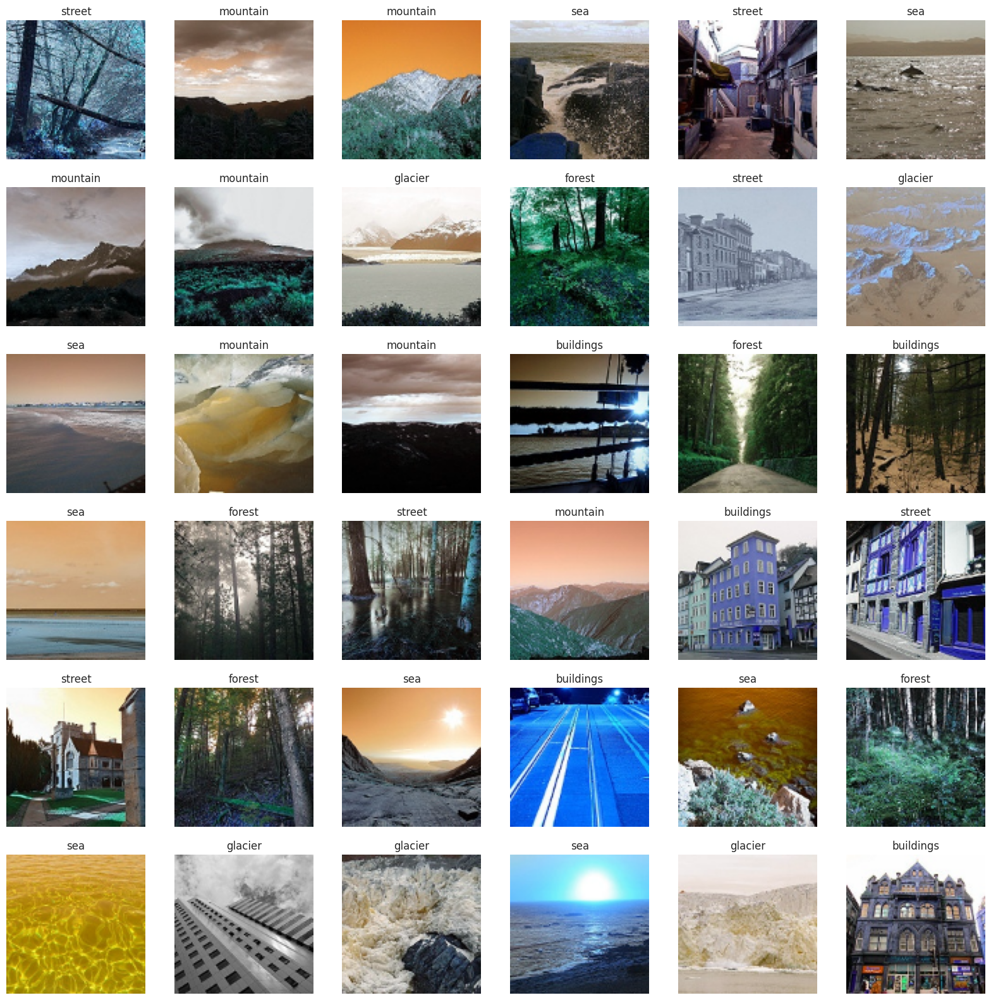

In [54]:
# now it's time to redict X Predict
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))